<html>
<h1  align="center"> Desafío: Análisis exploratorio de un dataset de precios de propiedades
    <hr>
    <img align="center;" style="background-color:
#253bff"; color:"#ff5d25";" src="https://lh3.googleusercontent.com/EdkAakQ9NeCIDTOsiJ9lITY1emd4tMxZ58t1RY5xRmZ0OwtDsV7zsxttGG4TEgwKXiTgK32rfjAo2MHeZ957ArCPItUltZU8Z2xVCg"; width="30%"; height="20%">

</h1>
</html>


<h1 align="center">Introducción</h1>
La inmobiliaria Properati publica periódicamente información sobre ofertas de propiedades para
venta y alquiler. Ud. deberá asesorar a la inmobiliaria a desarrollar un modelo de regresión que
permita predecir el precio por metro cuadrado de una propiedad. El objetivo final, a
concretarse en el Desafío 2, es que el modelo que desarrollen sea utilizado como tasador
automático a ser aplicado a las próximas propiedades que sean comercializadas por la
empresa. Para ello la empresa les provee de un dataset correspondiente al primer semestre de
2017.

El dataset es de tamaño entre pequeño y mediano, pero tiene dos complejidades a las que
deberán prestarle atención:

● Peso de missing data en algunas variables relevantes.

● Será importante tener en cuenta el problema de la influencia espacial en los precios por
metro cuadrado. En efecto, es probable que existan diferencias importantes en las
diferentes geografías, barrios y zonas analizadas.
Objetivos del Desafío 1:

● Efectuar una limpieza del dataset provisto. Particularmente, deberán diseñar estrategias
para lidiar con los datos perdidos en ciertas variables.

● Realizar un análisis descriptivo de las principales variables.

● Crear nuevas columnas a partir de las características dadas que puedan tener valor
predictivo.

<h1 align="center">Requisitos y material a entregar</h1>

1. Una jupyter notebook/lab que satisfaga los requerimientos del proyecto, donde se
realice y muestre la limpieza y el análisis de los datos a ser entregados. La notebook
deberá estar debidamente comentada, y debe poder ejecutarse sin errores de principio
a fin.
2. Una exposición de no más de 10 minutos del trabajo realizado, consistente en una
presentación acompañada con algunos slides no técnicos (PPT o Google Slides).
Esta presentación debe constar de:

● Una introducción (planteo del problema, la pregunta, la descripción del dataset,
etc.)

● Un desarrollo de los análisis realizados (análisis descriptivo, análisis de
correlaciones preliminares, visualizaciones preliminares)

● Una exposición de los principales resultados y conclusiones.
Importante: Esta presentación se entregará como un video grabado, junto con el
ppt/Google slides para que pueda ser revisado por la dupla docente.

<h1 align="center">Índice del análisis</h1>

- [**Introduccion**](#Introduccion)
- [**Lectura del Data Set**](#Lectura-del-Data-Set)
- [**Graficos**](#Graficos)
- [**Subset**](#Subset)
- [**Columnas sin nulos**](#Columnas-sin-nulos)
- [**Boxplots**](#Boxplots)
- [**Geopandas**](#Geopandas)

<html><h1 align="center", style="background: #414ce8; color:white">Introduccion</h1></html>

[**Volver al Inicio**](#Índice-del-análisis) 

Planteo del problema:

 * En base a los datos disponibles del data set buscaremos estimar los campos de precios por metro cuadrado en dolares que faltan en base a medidas de tendencia central. 
 


<html><h1 align="center", style="background: #414ce8; color:white">Lectura del Data Set</h1></html>

[**Volver al Inicio**](#Índice-del-análisis) 

In [ ]:
#!pip install google-colab
#from google.colab import drive
#drive.mount('/content/drive')

In [1]:
import pandas as pd
import numpy as np
import plotly.io as pio
import plotly.express as px
import plotly.figure_factory as ff
import matplotlib.pyplot as plt
import matplotlib.patches
import warnings

warnings.filterwarnings('ignore')


data_location = "properatti.csv"
data = pd.read_csv(data_location, sep=",")
print('El data frame contiene: ',data.shape[0], ' filas y ', data.shape[1], ' columnas.')


El data frame contiene:  121220  filas y  26  columnas.


## Inicio del análisis

In [2]:
print(data.dtypes)

Unnamed: 0                      int64
operation                      object
property_type                  object
place_name                     object
place_with_parent_names        object
country_name                   object
state_name                     object
geonames_id                   float64
lat-lon                        object
lat                           float64
lon                           float64
price                         float64
currency                       object
price_aprox_local_currency    float64
price_aprox_usd               float64
surface_total_in_m2           float64
surface_covered_in_m2         float64
price_usd_per_m2              float64
price_per_m2                  float64
floor                         float64
rooms                         float64
expenses                      float64
properati_url                  object
description                    object
title                          object
image_thumbnail                object
dtype: objec

In [3]:
data[]

,Unnamed: 0,operation,property_type,place_name,place_with_parent_names,country_name,state_name,geonames_id,lat-lon,lat,...,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses,properati_url,description,title,image_thumbnail
111277,111277,sell,apartment,Roosevelt,|Argentina|Buenos Aires Interior|Rivadavia|Roo...,Argentina,Buenos Aires Interior,3838609.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,http://www.properati.com.ar/1c5he_venta_depart...,"Piso alto, con muy buena vista a la Playa Mans...",Apartamentos en Roosevelt,https://thumbs4.properati.com/1/1LQPs6tMUAck-n...
54824,54824,sell,apartment,Rosario,|Argentina|Santa Fe|Rosario|,Argentina,Santa Fe,3838574.0,"-32.9440413,-60.6661371",-32.944041,...,NaN,NaN,NaN,NaN,NaN,NaN,http://www.properati.com.ar/19nve_venta_depart...,Inmobiliaria Gazze Vende Amplio Monoambiente D...,Rosario - Francia 993 - Venta Monoambiente div...,https://thumbs4.properati.com/7/yG2fCQLjwyyuUq...
45346,45346,sell,apartment,Córdoba,|Argentina|Córdoba|Córdoba|,Argentina,Córdoba,3860259.0,NaN,NaN,...,460.0,333.333333,1086.956522,NaN,NaN,NaN,http://www.properati.com.ar/193up_venta_depart...,"Hermoso duplex, compuesto por:Planta Alta: tre...",Hermosa Propiedad a estrenar en Costa Verde.,https://thumbs4.properati.com/2/9u74G8bDqVPUat...
83413,83413,sell,apartment,Capital Federal,|Argentina|Capital Federal|,Argentina,Capital Federal,3433955.0,NaN,NaN,...,100.0,1600.000000,1600.000000,NaN,NaN,9900.0,http://www.properati.com.ar/1b0h7_venta_depart...,Departamento apto profesional de 100 m2. Hall ...,Departamento Apto profesional en excelente ubi...,https://thumbs4.properati.com/5/SHCIF_9pM_lcEY...
103409,103409,sell,apartment,Castelar,|Argentina|Bs.As. G.B.A. Zona Oeste|Morón|Cast...,Argentina,Bs.As. G.B.A. Zona Oeste,3435607.0,NaN,NaN,...,47.0,NaN,2234.042553,NaN,NaN,700.0,http://www.properati.com.ar/1brxb_venta_depart...,DEPARTAMENTO DE DOS AMBIENTES 3º PISO CON BA...,Departamento - Castelar Norte,https://thumbs4.properati.com/4/SIjtj4mJx-MXrU...


 * Capital tiene la mayor cantidad de datos de precios del data set.

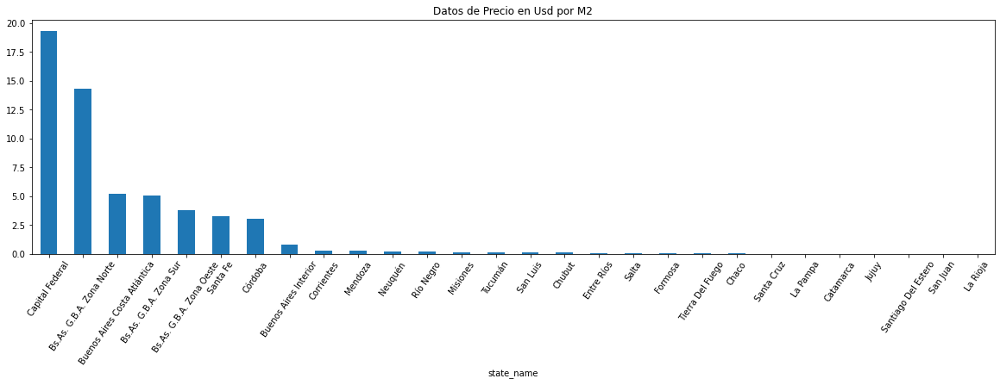

In [4]:
((data.groupby("state_name").price_usd_per_m2.count()/data.shape[0])*100).sort_values(ascending = False).plot(kind='bar' ,title ='Datos de Precio en Usd por M2', figsize= (20 , 5), rot = 55);

<html><h1 align="center", style="background: #414ce8; color:white">Graficos</h1></html>

[**Volver al Inicio**](#Índice-del-análisis) 

In [5]:
state = data.groupby('state_name')['price_usd_per_m2'].mean().sort_values(ascending = False).index
values = data.groupby('state_name')['price_usd_per_m2'].mean().sort_values(ascending = False).values

datas = {'state': state, 'price_mean': values}
df = pd.DataFrame(datas)


def getPlot(df, x, y, title , x_descripy, y_descripy,  number_color):
    fig = px.bar(df, x=x, y=y,
                title= title,
                color_discrete_sequence=[px.colors.qualitative.Alphabet[number_color]],
                width=800, height=600,
                labels={x:x_descripy, y:y_descripy},
                template="simple_white"
                )
    return fig.show()



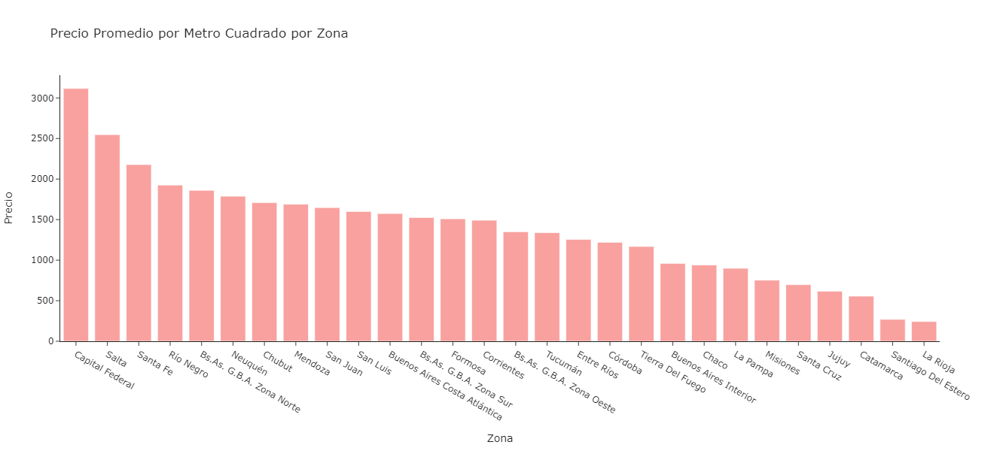

In [6]:
getPlot(df, 'state', 'price_mean', 'Precio Promedio por Metro Cuadrado por Zona' , 'Zona', 'Precio' , 15)

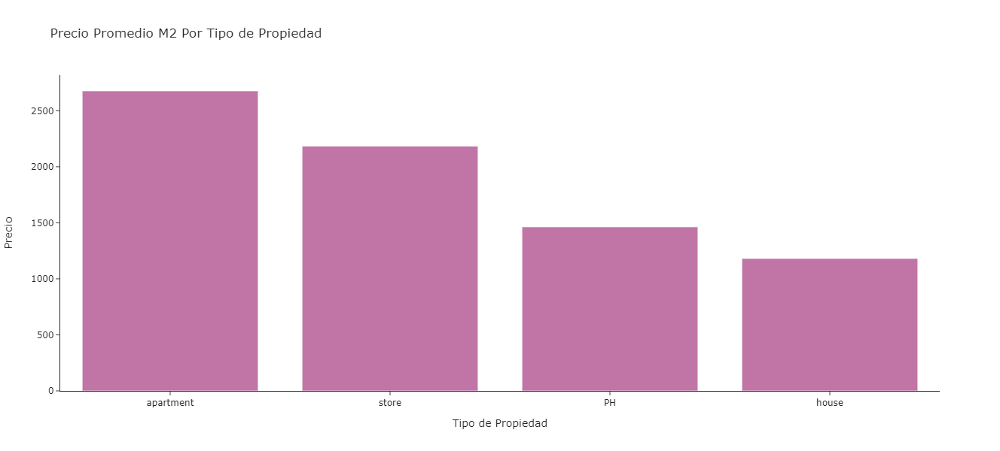

In [7]:
tipo = data.groupby('property_type')['price_usd_per_m2'].mean().sort_values(ascending = False).index
values = data.groupby('property_type')['price_usd_per_m2'].mean().sort_values(ascending = False).values

datas = {'tipo': tipo, 'price_mean': values}
df = pd.DataFrame(datas)

getPlot(df, 'tipo', 'price_mean', 'Precio Promedio M2 Por Tipo de Propiedad' , 'Tipo de Propiedad', 'Precio', 21)

- En la siguiente funcion podemos sacar distintas metricas de Barrios agrupando por Zona

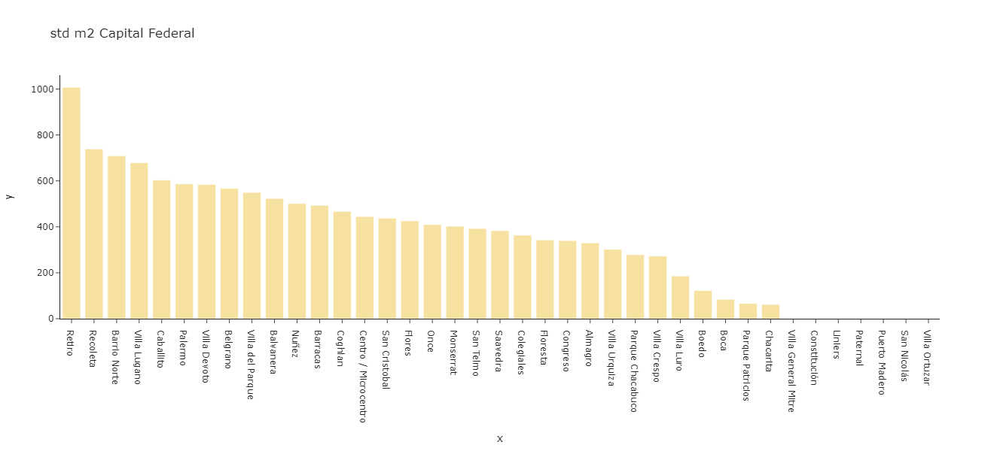

In [8]:
'''
                   Opciones Filtro:
                    
'Capital Federal', 'Bs.As. G.B.A. Zona Sur',
'Buenos Aires Costa Atlántica', 'Entre Ríos',
'Bs.As. G.B.A. Zona Norte', 'Santa Fe', 'Córdoba',
'Bs.As. G.B.A. Zona Oeste', 'Misiones', 'Buenos Aires Interior',
'Salta', 'Neuquén', 'Río Negro', 'San Luis', 'Mendoza',
'Corrientes', 'Chubut', 'Tucumán', 'La Pampa', 'Chaco', 'San Juan',
'Santa Cruz', 'Tierra Del Fuego', 'Catamarca',
'Santiago Del Estero', 'Jujuy', 'La Rioja', 'Formosa'


                   Opciones Estadistico:
'std':  Desvio,
'mean': Promedio,
'sum':  Sumatoria,
'cov'   Coeficiente de Variacion              
'''

def getPlotGroup(data, filtro, estadistico, number_color):
    data = data.loc[data['state_name'] == filtro, ].dropna(axis=0)
    if estadistico == 'mean':
        x = data.groupby('place_name')['price_usd_per_m2'].mean().sort_values(ascending = False).index
        y = data.groupby('place_name')['price_usd_per_m2'].mean().sort_values(ascending = False).values
    elif estadistico == 'sum':
        x = data.groupby('place_name')['price_usd_per_m2'].sum().sort_values(ascending = False).index
        y = data.groupby('place_name')['price_usd_per_m2'].sum().sort_values(ascending = False).values
    elif estadistico == 'std':
        x = data.groupby('place_name')['price_usd_per_m2'].std().sort_values(ascending = False).index
        y = data.groupby('place_name')['price_usd_per_m2'].std().sort_values(ascending = False).values
    elif estadistico == 'cov':
        x = (data.groupby('place_name')['price_usd_per_m2'].std() / data.groupby('place_name')['price_usd_per_m2'].mean() ).sort_values(ascending = False).index
        y = (data.groupby('place_name')['price_usd_per_m2'].std() / data.groupby('place_name')['price_usd_per_m2'].mean() ).sort_values(ascending = False).values
    df = pd.DataFrame({'x': x, 'y': y})
    fig = px.bar(df, x=x, y=y,
                title= estadistico + ' m2 ' + filtro,
                color_discrete_sequence=[px.colors.qualitative.Alphabet[number_color]],
                width=800, height=600,
                template="simple_white"
                )
    return fig.show()
    
'''
Funcion:
'''
    
getPlotGroup(data, 'Capital Federal', 'std' , 7)

<html><h1 align="center", style="background: #414ce8; color:white">Subset</h1></html>

[**Volver al Inicio**](#Índice-del-análisis) 


- En base al grafico anterior decidimos seguir trabajando solo con los datos de Capital Federal.

- Guardamos df_caba_original para luego de la limpieza de outliers hacer una comparacion con este data set

In [9]:
df_caba_original = data[data['state_name'] == 'Capital Federal']
df_caba = data[data['state_name'] == 'Capital Federal']
df_caba.head(5)
display(df_caba.shape)

(32316, 26)

In [10]:
df_caba.head(5)

,Unnamed: 0,operation,property_type,place_name,place_with_parent_names,country_name,state_name,geonames_id,lat-lon,lat,...,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses,properati_url,description,title,image_thumbnail
0,0,sell,PH,Mataderos,|Argentina|Capital Federal|Mataderos|,Argentina,Capital Federal,3430787.0,"-34.6618237,-58.5088387",-34.661824,...,40.0,1127.272727,1550.000000,NaN,NaN,NaN,http://www.properati.com.ar/15bo8_venta_ph_mat...,"2 AMBIENTES TIPO CASA PLANTA BAJA POR PASILLO,...",2 AMB TIPO CASA SIN EXPENSAS EN PB,https://thumbs4.properati.com/8/BluUYiHJLhgIIK...
2,2,sell,apartment,Mataderos,|Argentina|Capital Federal|Mataderos|,Argentina,Capital Federal,3430787.0,"-34.6522615,-58.5229825",-34.652262,...,55.0,1309.090909,1309.090909,NaN,NaN,NaN,http://www.properati.com.ar/15bod_venta_depart...,2 AMBIENTES 3ER PISO LATERAL LIVING COMEDOR AM...,2 AMB 3ER PISO CON ASCENSOR APTO CREDITO,https://thumbs4.properati.com/5/SXKr34F_IwG3W_...
3,3,sell,PH,Liniers,|Argentina|Capital Federal|Liniers|,Argentina,Capital Federal,3431333.0,"-34.6477969,-58.5164244",-34.647797,...,NaN,NaN,NaN,NaN,NaN,NaN,http://www.properati.com.ar/15boh_venta_ph_lin...,PH 3 ambientes con patio. Hay 3 deptos en lote...,PH 3 amb. cfte. reciclado,https://thumbs4.properati.com/3/DgIfX-85Mog5SP...
7,7,sell,apartment,Belgrano,|Argentina|Capital Federal|Belgrano|,Argentina,Capital Federal,3436077.0,"-34.5598729,-58.443362",-34.559873,...,40.0,3066.666667,3450.000000,NaN,NaN,NaN,http://www.properati.com.ar/15bot_venta_depart...,EXCELENTE MONOAMBIENTE A ESTRENAR AMPLIO SUPER...,JOSE HERNANDEZ 1400 MONOAMBIENTE ESTRENAR CAT...,https://thumbs4.properati.com/1/IHxARynlr8sPEW...
8,8,sell,apartment,Belgrano,|Argentina|Capital Federal|Belgrano|,Argentina,Capital Federal,3436077.0,"-34.5598729,-58.443362",-34.559873,...,60.0,3000.000000,3250.000000,NaN,NaN,NaN,http://www.properati.com.ar/15bou_venta_depart...,EXCELENTE DOS AMBIENTES ESTRENAR AMPLIO SUPER...,"JOSE HERNANDEZ 1400 DOS AMBIENTES ESTRENAR ,...",https://thumbs4.properati.com/2/J3zOjgaFHrkvnv...


* En el siguiente grafico podemos observar valores que estan muy lejos de los normales, en superficie y en precio.

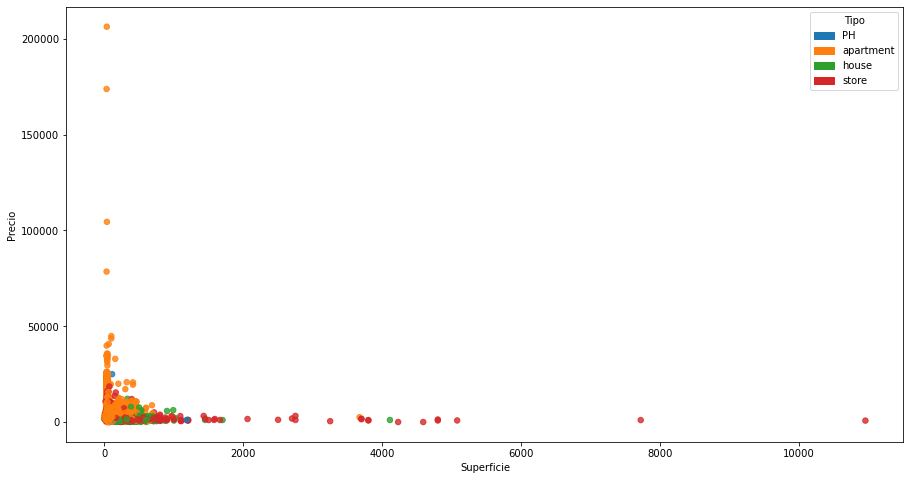

In [12]:
levels, categories = pd.factorize(df_caba['property_type'])
colors = [plt.cm.tab10(i) for i in levels] 
handles = [matplotlib.patches.Patch(color=plt.cm.tab10(i), label=c) for i, c in enumerate(categories)]

plt.scatter(df_caba['surface_covered_in_m2'],df_caba['price_usd_per_m2'], s=30, alpha=0.8, c =colors)
plt.xlabel('Superficie')
plt.ylabel('Precio')
plt.legend(handles=handles, title='Tipo')
plt.rcParams["figure.figsize"] = (20,8)
plt.show()

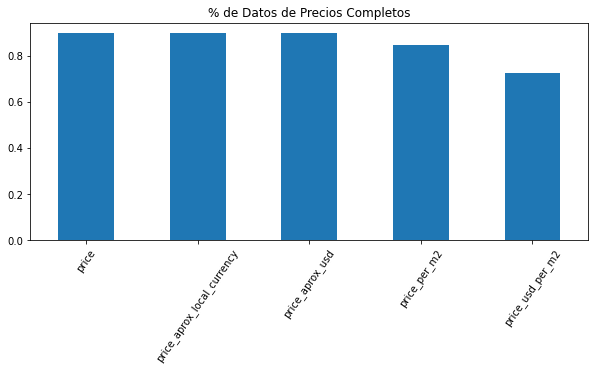

In [13]:


(df_caba[['price_usd_per_m2','price_per_m2','price_aprox_usd','price_aprox_local_currency', 'price']].notnull().sum()/df_caba.shape[0]).sort_values(ascending = False).plot(kind='bar' ,title ='% de Datos de Precios Completos', figsize= (10 , 4), rot = 55);


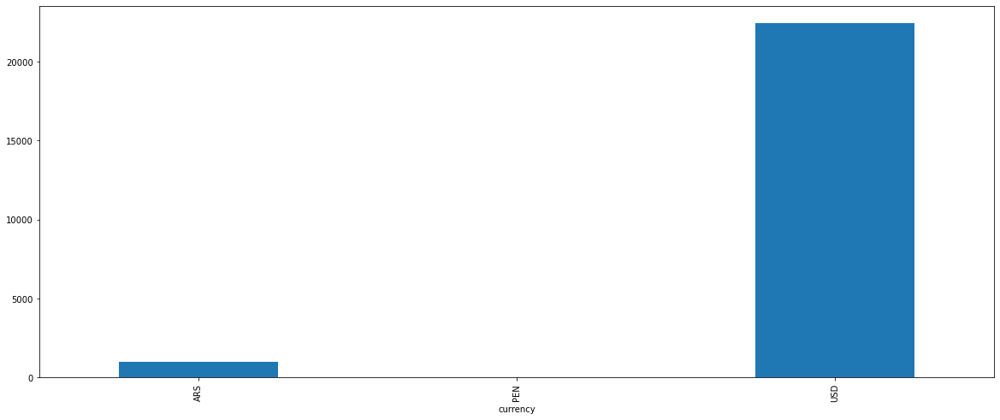

In [14]:
df_caba.groupby(['currency'])['price_usd_per_m2'].count().plot(kind='bar', stacked=True);


* Vemos que son valores de Palermo y Boedo, parecerian ser errores de tipeo. Se prodece a eliminarlos mas adelante usando una metodologia de outliers.




In [15]:
df_caba[(df_caba['price_usd_per_m2'] > 50000)]

,Unnamed: 0,operation,property_type,place_name,place_with_parent_names,country_name,state_name,geonames_id,lat-lon,lat,...,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses,properati_url,description,title,image_thumbnail
25853,25853,sell,apartment,Boedo,|Argentina|Capital Federal|Boedo|,Argentina,Capital Federal,3436003.0,NaN,NaN,...,30.0,78533.333333,78533.333333,NaN,1.0,NaN,http://www.properati.com.ar/17qgx_venta_depart...,bf221- INCREIBLE FORMA DE PAGO- ANT Y CUOTAS D...,bf221- INCREIBLE FORMA DE PAGO- ANT Y CUOTAS D...,https://thumbs4.properati.com/5/-g7Ufd8oE1D5gC...
26037,26037,sell,apartment,Boedo,|Argentina|Capital Federal|Boedo|,Argentina,Capital Federal,3436003.0,NaN,NaN,...,30.0,173826.066667,173826.066667,NaN,1.0,NaN,http://www.properati.com.ar/17qou_venta_depart...,lan840- DEPTO FINANCIACION DIRECTA EN PESOSAnt...,lan840- DEPTO FINANCIACION DIRECTA EN PESOS,https://thumbs4.properati.com/0/cr-NvID1VVGL4R...
26193,26193,sell,apartment,Boedo,|Argentina|Capital Federal|Boedo|,Argentina,Capital Federal,3436003.0,NaN,NaN,...,35.0,104486.114286,104486.114286,NaN,1.0,NaN,http://www.properati.com.ar/17quf_venta_depart...,fac030- Depto anticipo en 10 meses y saldo en ...,fac030- Depto anticipo en 10 meses y saldo en ...,https://thumbs4.properati.com/5/6ieB5ag091SbEO...
26637,26637,sell,apartment,Boedo,|Argentina|Capital Federal|Boedo|,Argentina,Capital Federal,3436003.0,"-34.6222039,-58.416089",-34.622204,...,33.0,206333.333333,206333.333333,NaN,1.0,NaN,http://www.properati.com.ar/17rbf_venta_depart...,Departamento 1 ambiente divisible Depto en CU...,"Tu depa, ingresa con $ 29.000 y cuotas en pesos",https://thumbs4.properati.com/0/S-zC2PgWGFWuGB...


In [21]:

data.loc[(data['surface_covered_in_m2'] > 1000), ['lat']]

,lat
78,-27.355467
525,NaN
3325,-34.620296
3762,-31.392317
4447,-34.348161
...,...
118714,-34.638347
119355,-31.415698
119935,-31.088003
120302,NaN



### Limpiando Outliers:



- Se agrupan por Zona y tipo de inmueble. Luego se sacan los percentiles 75 y 25, el rango intercuartil y mediante la metodologia de los outliers se extraen los indices de los precios por metro cuadrado en dolares que estan considerados como outliers para este trabajo.

In [18]:
import itertools

lista_index   = []
for i in range(len(df_caba.place_name.unique())):
    for tipo in list(df_caba.property_type.unique()):
        try:
            q75,q25 = np.nanpercentile(df_caba.loc[(df_caba.place_name == df_caba.place_name.unique()[i]) &  (df_caba.property_type == tipo), ['price_usd_per_m2']], [75, 25])
            rango_max = q75 + 1.5 * (q75 - q25)   
            rango_min = q25 - 1.5 * (q75 - q25) 
            index_maximos = list(df_caba.loc[(df_caba.place_name == df_caba.place_name.unique()[i]) &  (df_caba.property_type == tipo), ['price_usd_per_m2']][df_caba['price_usd_per_m2'] > rango_max].index)
            index_minimos = list(df_caba.loc[(df_caba.place_name == df_caba.place_name.unique()[i]) &  (df_caba.property_type == tipo), ['price_usd_per_m2']][df_caba['price_usd_per_m2'] < rango_min].index)
            index_total = index_maximos + index_minimos
            if len(index_total) >= 1:
                lista_index.append(index_total)
        except Exception as error:
            print(df_caba.place_name.unique()[i], ' No tiene: ', tipo)
lista_filtro = list(itertools.chain.from_iterable(lista_index))
print('Total de indices a eliminar: ',len(lista_filtro))

Puerto Madero  No tiene:  PH
Villa Pueyrredón  No tiene:  store
Parque Centenario  No tiene:  house
Parque Avellaneda  No tiene:  store
Versalles  No tiene:  store
Retiro  No tiene:  PH
Centro / Microcentro  No tiene:  PH
Once  No tiene:  house
Tribunales  No tiene:  house
Catalinas  No tiene:  PH
Catalinas  No tiene:  house
Villa General Mitre  No tiene:  store
Villa Riachuelo  No tiene:  store
Total de indices a eliminar:  1036


In [19]:
df_caba.drop(lista_filtro, axis=0, inplace=True)
df_caba.reset_index(drop=True, inplace=True)
df_caba.shape


df_m = df[]
df_m.reset_index(drop=True, inplace=True)

(31280, 26)

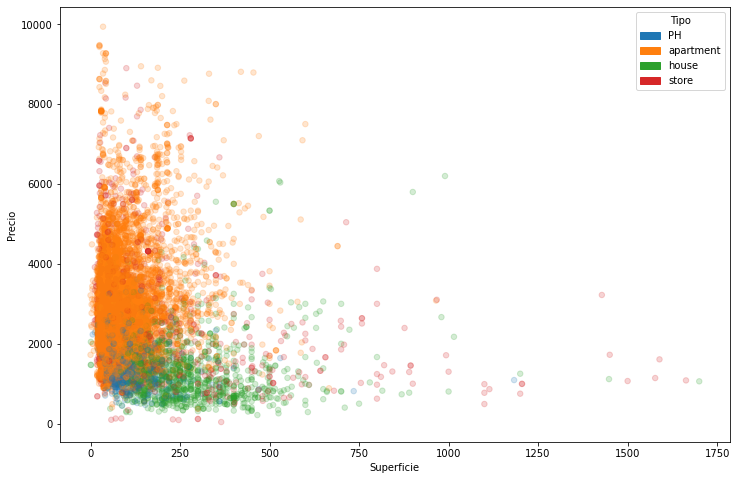

In [42]:
df_caba_filter = df_caba.loc[(df_caba['surface_covered_in_m2'] < 2000) & (df_caba['price_usd_per_m2'] < 10000)]

levels, categories = pd.factorize(df_caba_filter['property_type'])
colors = [plt.cm.tab10(i) for i in levels] 
handles = [matplotlib.patches.Patch(color=plt.cm.tab10(i), label=c) for i, c in enumerate(categories)]

plt.scatter(df_caba_filter['surface_covered_in_m2'],df_caba_filter['price_usd_per_m2'], s=30, alpha=0.2, c =colors)
plt.xlabel('Superficie')
plt.ylabel('Precio')
plt.legend(handles=handles, title='Tipo')
plt.rcParams["figure.figsize"] = (12,8)
plt.show()

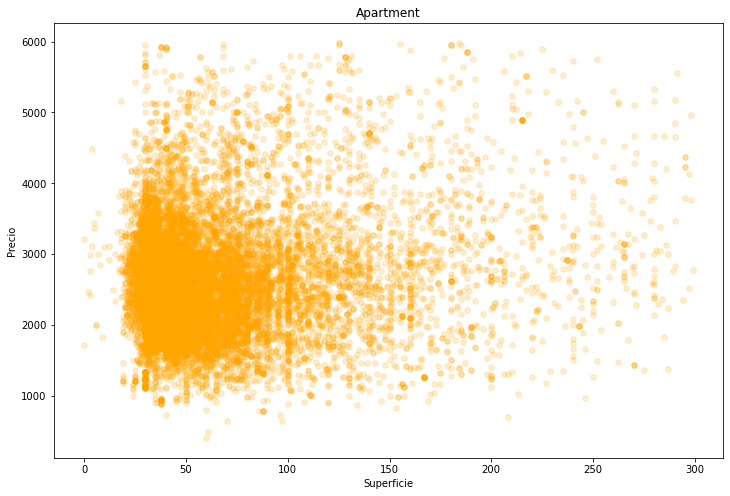

In [45]:
df_caba_filter = df_caba.loc[(df_caba['surface_covered_in_m2'] < 300) & (df_caba['price_usd_per_m2'] < 6000)]

plt.scatter(df_caba_filter.loc[df_caba_filter['property_type'] == 'apartment' , ['surface_covered_in_m2']], df_caba_filter.loc[df_caba_filter['property_type'] == 'apartment' , ['price_usd_per_m2']], s=30, alpha=0.2, c = 'orange')
plt.xlabel('Superficie')
plt.ylabel('Precio')
plt.title('Apartment')
plt.rcParams["figure.figsize"] = (12,8)
plt.show()

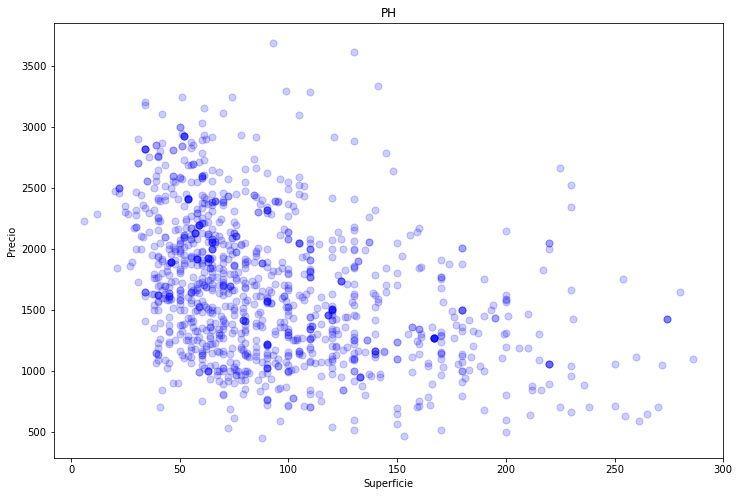

In [49]:
df_caba_filter = df_caba.loc[(df_caba['surface_covered_in_m2'] < 300) & (df_caba['price_usd_per_m2'] < 6000)]

plt.scatter(df_caba_filter.loc[df_caba_filter['property_type'] == 'PH' , ['surface_covered_in_m2']], df_caba_filter.loc[df_caba_filter['property_type'] == 'PH' , ['price_usd_per_m2']], s=50, alpha=0.2, c = 'blue')
plt.xlabel('Superficie')
plt.ylabel('Precio')
plt.title('PH')
plt.rcParams["figure.figsize"] = (12,8)
plt.show()

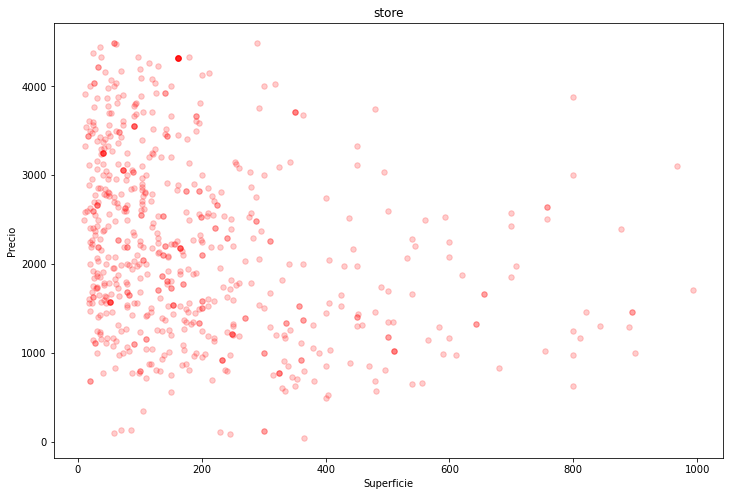

In [54]:
df_caba_filter = df_caba.loc[(df_caba['surface_covered_in_m2'] < 1000) & (df_caba['price_usd_per_m2'] < 4500)]

plt.scatter(df_caba_filter.loc[df_caba_filter['property_type'] == 'store' , ['surface_covered_in_m2']], df_caba_filter.loc[df_caba_filter['property_type'] == 'store' , ['price_usd_per_m2']], s=30, alpha=0.2, c = 'red')
plt.xlabel('Superficie')
plt.ylabel('Precio')
plt.title('store')
plt.rcParams["figure.figsize"] = (12,8)
plt.show()

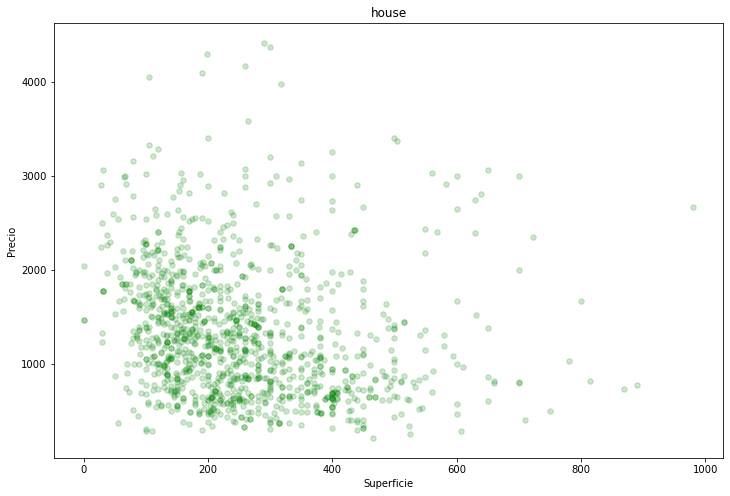

In [55]:
df_caba_filter = df_caba.loc[(df_caba['surface_covered_in_m2'] < 1000) & (df_caba['price_usd_per_m2'] < 4500)]

plt.scatter(df_caba_filter.loc[df_caba_filter['property_type'] == 'house' , ['surface_covered_in_m2']], df_caba_filter.loc[df_caba_filter['property_type'] == 'house' , ['price_usd_per_m2']], s=30, alpha=0.2, c = 'green')
plt.xlabel('Superficie')
plt.ylabel('Precio')
plt.title('house')
plt.rcParams["figure.figsize"] = (12,8)
plt.show()


### Graficando Outliers:



- El siguiente grafico muestra dos outputs, uno con boxplots que contiene outliers y otro sin los outliers.

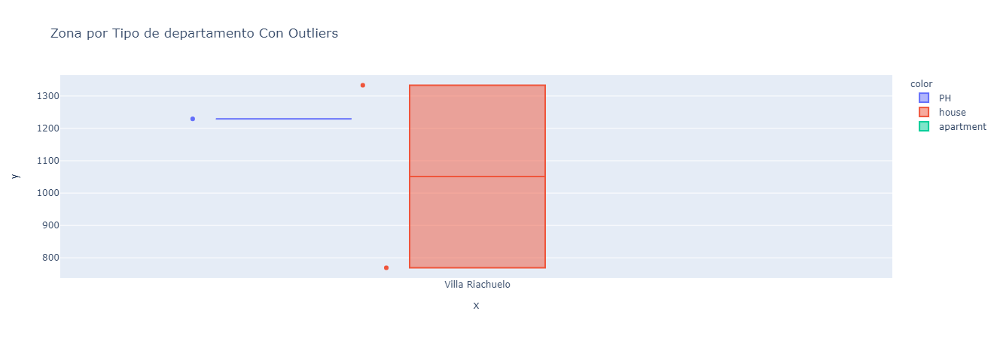

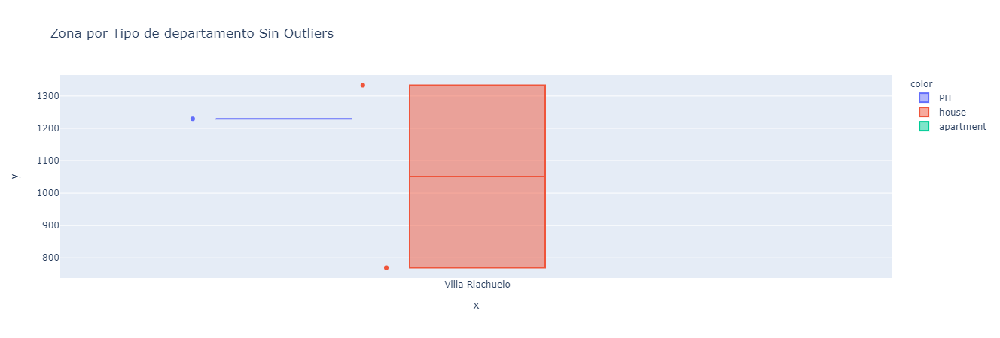

In [213]:
from time import sleep
from IPython.display import clear_output
import plotly.express as px

zonas = list(df_caba.place_name.unique())
for zona in zonas:
    x        = df_caba_original.loc[df_caba_original['place_name'] == zona, ]['place_name']
    y        = df_caba_original.loc[df_caba_original['place_name'] == zona, ]['price_usd_per_m2']
    color    = df_caba_original.loc[df_caba_original['place_name'] == zona, ]['property_type']
    x_dos    = df_caba.loc[df_caba['place_name'] == zona, ]['place_name']
    y_dos    = df_caba.loc[df_caba['place_name'] == zona, ]['price_usd_per_m2']
    color_dos= df_caba.loc[df_caba['place_name'] == zona, ]['property_type']
    fig      = px.box(df_caba_original, x= x, y=y, points="all", color = color, title="Zona por Tipo de departamento Con Outliers")
    figdos   = px.box(df_caba, x= x_dos, y=y_dos, points="all", color = color_dos, title="Zona por Tipo de departamento Sin Outliers")
    fig.show()
    figdos.show()
    sleep(2.5)
    clear_output(wait=True)


### Valores Nulos:


- Podemos observar que la columna <b>floor</b> ,<b>expensas</b> y <b>rooms</b> contienen mas del 60 % de valores como nulos.

In [57]:
round(df_caba.isnull().sum() / df_caba.shape[0],2).sort_values(ascending = False)

floor                         0.90
expenses                      0.80
rooms                         0.53
price_usd_per_m2              0.28
lon                           0.26
lat-lon                       0.26
lat                           0.26
surface_total_in_m2           0.19
price_per_m2                  0.16
currency                      0.11
price_aprox_usd               0.11
price_aprox_local_currency    0.11
price                         0.11
surface_covered_in_m2         0.07
geonames_id                   0.04
image_thumbnail               0.02
title                         0.00
properati_url                 0.00
description                   0.00
state_name                    0.00
country_name                  0.00
place_with_parent_names       0.00
place_name                    0.00
property_type                 0.00
operation                     0.00
Unnamed: 0                    0.00
dtype: float64


- Exploramos algunas variables para ver si podemos ir limpiando el dataset:


In [58]:
for i in range(len(df_caba.columns)):
    if len(df_caba[df_caba.columns.values[i]].unique()) == 1 or round(df_caba.isnull().sum() / df_caba.shape[0],2)[i] >= 0.5:
        print('La columna :',df_caba.columns[i], 'tiene ', len(df_caba[df_caba.columns.values[i]].unique()), 'valor/es unico/s y el', 100 * round(df_caba.isnull().sum() / df_caba.shape[0],2)[i], '% de valores Nulos')

La columna : operation tiene  1 valor/es unico/s y el 0.0 % de valores Nulos
La columna : country_name tiene  1 valor/es unico/s y el 0.0 % de valores Nulos
La columna : state_name tiene  1 valor/es unico/s y el 0.0 % de valores Nulos
La columna : floor tiene  86 valor/es unico/s y el 90.0 % de valores Nulos
La columna : rooms tiene  18 valor/es unico/s y el 53.0 % de valores Nulos
La columna : expenses tiene  732 valor/es unico/s y el 80.0 % de valores Nulos


In [59]:
df_caba.drop('floor',        inplace=True, axis=1)
df_caba.drop('expenses',     inplace=True, axis=1)
df_caba.drop('Unnamed: 0',   inplace=True, axis=1)
df_caba.drop('operation',    inplace=True, axis=1)
df_caba.drop('country_name', inplace=True, axis=1)

In [60]:

print('El data frame contiene: ',df_caba.shape[0], ' filas y ', df_caba.shape[1], ' columnas.')
df_caba.head(4)


El data frame contiene:  31280  filas y  21  columnas.


,property_type,place_name,place_with_parent_names,state_name,geonames_id,lat-lon,lat,lon,price,currency,...,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,price_per_m2,rooms,properati_url,description,title,image_thumbnail
0,PH,Mataderos,|Argentina|Capital Federal|Mataderos|,Capital Federal,3430787.0,"-34.6618237,-58.5088387",-34.661824,-58.508839,62000.0,USD,...,62000.0,55.0,40.0,1127.272727,1550.000000,NaN,http://www.properati.com.ar/15bo8_venta_ph_mat...,"2 AMBIENTES TIPO CASA PLANTA BAJA POR PASILLO,...",2 AMB TIPO CASA SIN EXPENSAS EN PB,https://thumbs4.properati.com/8/BluUYiHJLhgIIK...
1,apartment,Mataderos,|Argentina|Capital Federal|Mataderos|,Capital Federal,3430787.0,"-34.6522615,-58.5229825",-34.652262,-58.522982,72000.0,USD,...,72000.0,55.0,55.0,1309.090909,1309.090909,NaN,http://www.properati.com.ar/15bod_venta_depart...,2 AMBIENTES 3ER PISO LATERAL LIVING COMEDOR AM...,2 AMB 3ER PISO CON ASCENSOR APTO CREDITO,https://thumbs4.properati.com/5/SXKr34F_IwG3W_...
2,PH,Liniers,|Argentina|Capital Federal|Liniers|,Capital Federal,3431333.0,"-34.6477969,-58.5164244",-34.647797,-58.516424,95000.0,USD,...,95000.0,NaN,NaN,NaN,NaN,NaN,http://www.properati.com.ar/15boh_venta_ph_lin...,PH 3 ambientes con patio. Hay 3 deptos en lote...,PH 3 amb. cfte. reciclado,https://thumbs4.properati.com/3/DgIfX-85Mog5SP...
3,apartment,Belgrano,|Argentina|Capital Federal|Belgrano|,Capital Federal,3436077.0,"-34.5598729,-58.443362",-34.559873,-58.443362,138000.0,USD,...,138000.0,45.0,40.0,3066.666667,3450.000000,NaN,http://www.properati.com.ar/15bot_venta_depart...,EXCELENTE MONOAMBIENTE A ESTRENAR AMPLIO SUPER...,JOSE HERNANDEZ 1400 MONOAMBIENTE ESTRENAR CAT...,https://thumbs4.properati.com/1/IHxARynlr8sPEW...


In [61]:
round(df_caba.isnull().sum() / df_caba.shape[0],2).sort_values(ascending = False)

rooms                         0.53
price_usd_per_m2              0.28
lon                           0.26
lat-lon                       0.26
lat                           0.26
surface_total_in_m2           0.19
price_per_m2                  0.16
price_aprox_local_currency    0.11
price_aprox_usd               0.11
currency                      0.11
price                         0.11
surface_covered_in_m2         0.07
geonames_id                   0.04
image_thumbnail               0.02
title                         0.00
properati_url                 0.00
description                   0.00
state_name                    0.00
place_with_parent_names       0.00
place_name                    0.00
property_type                 0.00
dtype: float64

<html><h1 align="center", style="background: #414ce8; color:white">Columnas sin nulos</h1></html>

[**Volver al Inicio**](#Índice-del-análisis) 

In [62]:

for i in range(len(df_caba.columns)):
    if round(df_caba.isnull().sum() / df_caba.shape[0],2)[i] == 0:
        print(df_caba.columns[i], ' tiene ', round(df_caba.isnull().sum() / df_caba.shape[0],2)[i], ' valores Nulos')


property_type  tiene  0.0  valores Nulos
place_name  tiene  0.0  valores Nulos
place_with_parent_names  tiene  0.0  valores Nulos
state_name  tiene  0.0  valores Nulos
properati_url  tiene  0.0  valores Nulos
description  tiene  0.0  valores Nulos
title  tiene  0.0  valores Nulos


<h3 align="left", style="background: white; color:black">Podemos obtener datos relevantes de: description y title</h3>

In [63]:
print('description: \n')
display(df_caba['description'].head(5))
print('\ntitle: \n')
display(df_caba['title'].head(5))

description: 



0    2 AMBIENTES TIPO CASA PLANTA BAJA POR PASILLO,...
1    2 AMBIENTES 3ER PISO LATERAL LIVING COMEDOR AM...
2    PH 3 ambientes con patio. Hay 3 deptos en lote...
3    EXCELENTE MONOAMBIENTE A ESTRENAR AMPLIO SUPER...
4    EXCELENTE DOS AMBIENTES  ESTRENAR AMPLIO SUPER...
Name: description, dtype: object


title: 



0                   2 AMB TIPO CASA SIN EXPENSAS EN PB
1             2 AMB 3ER PISO CON ASCENSOR APTO CREDITO
2                         PH 3 amb. cfte. reciclado   
3    JOSE HERNANDEZ 1400 MONOAMBIENTE  ESTRENAR CAT...
4    JOSE HERNANDEZ   1400 DOS AMBIENTES ESTRENAR ,...
Name: title, dtype: object

<h2 align="left", style="background: white; color:black">Libreria nltk</h2>

- Utilizamos la libreria para limpiar la columna descripcion de StopWords

In [64]:
# !pip install nltk
import nltk
from nltk.corpus import stopwords
stopwords = stopwords.words('spanish')
len(stopwords)
stopwords.append('-')
stopwords.append(' ')
print('Primeros StopWords: ',stopwords[0:15])

Primeros StopWords:  ['de', 'la', 'que', 'el', 'en', 'y', 'a', 'los', 'del', 'se', 'las', 'por', 'un', 'para', 'con']


<h2 align="left", style="background: white; color:black">Filtro de Palabras</h2>

<h3 align="left", style="background: white; color:red">Importante: </h3>
<b> El siguiente comando puede durar mas de 1 minuto de ejecucion ya que recorre todas las filas y cada uno de los StopWords: </b>

In [65]:
elementos_sin_stowpords_descripcion = []
elementos_sin_stowpords_titulo = []
for i in range(df_caba.shape[0]):
    elemento_descripcion = ' '.join([word for word in df_caba['description'][i].lower().split(' ') if word not in stopwords])
    elementos_sin_stowpords_descripcion.append(elemento_descripcion)
    elemento_titulo = ' '.join([word for word in df_caba['title'][i].lower().split(' ') if word not in stopwords])
    elementos_sin_stowpords_titulo.append(elemento_titulo)

<h3 align="left", style="background: white; color:black">Descripcion: </h3>

In [66]:
print('Con Stopwords:\n')
print('Longitud: ',len(df_caba['description']),'\n')
display(df_caba['description'][0].lower())
print('\nSin Stopwords: \n')
print('Longitud: ',len(elementos_sin_stowpords_descripcion),'\n')
display(elementos_sin_stowpords_descripcion[0])

Con Stopwords:

Longitud:  31280 



'2 ambientes tipo casa planta baja por pasillo, refaccionado a nuevo, patio grande, con lavadero, living comedor con cocina integrada, artefacto de cocina, alacena, baño completo, y dormitorio. todo en excelente estado, para habitar.no es apto credito aviso publicado por pixel inmobiliario (servicio de páginas web para inmobiliarias).'


Sin Stopwords: 

Longitud:  31280 



'2 ambientes tipo casa planta baja pasillo, refaccionado nuevo, patio grande, lavadero, living comedor cocina integrada, artefacto cocina, alacena, baño completo, dormitorio. excelente estado, habitar.no apto credito aviso publicado pixel inmobiliario (servicio páginas web inmobiliarias).'

<h3 align="left", style="background: white; color:black">Titulo: </h3>

In [67]:
print('Con Stopwords:\n')
print('Longitud: ',len(df_caba['title']),'\n')
display(df_caba['title'][3].lower())
print('\nSin Stopwords: \n')
print('Longitud: ',len(elementos_sin_stowpords_titulo),'\n')
display(elementos_sin_stowpords_titulo[3])

Con Stopwords:

Longitud:  31280 



'jose hernandez 1400 monoambiente  estrenar categoria , venta'


Sin Stopwords: 

Longitud:  31280 



'jose hernandez 1400 monoambiente  estrenar categoria , venta'

- Almacenamos todas las Palabras netas de StopWords que aparecen en descripcion y en titulo para ver cuales se encuentran con mayor frecuencia

In [68]:
palabras_descripcion = []
for i in range(len(elementos_sin_stowpords_descripcion)):
    lista_uno = elementos_sin_stowpords_descripcion[i]
    lista_uno = lista_uno.split(' ')
    for lista in lista_uno:
        palabras_descripcion.append(lista)
        
palabras_titulo = []
for i in range(len(elementos_sin_stowpords_titulo)):
    lista_uno = elementos_sin_stowpords_titulo[i]
    lista_uno = lista_uno.split(' ')
    for lista in lista_uno:
        palabras_titulo.append(lista)

- Value Counts titulo y descripcion

In [69]:
values_descripcion = pd.Series(palabras_descripcion).value_counts()

values_descripcion = values_descripcion[1:] # Eliminamos el primer elemento ya que son vacios

values_titulo = pd.Series(palabras_titulo).value_counts()


print('Descripcion Value Counts:\n')
display(values_descripcion)
print('\nTitulo Value Counts: \n')
display(values_titulo)



Descripcion Value Counts:



cocina                    19652
2                         18334
baño                      16218
ambientes                 15214
3                         13877
                          ...  
420561009-24imponente,        1
cordoba,cercano               1
181255-158monoambiente        1
2566-2                        1
vertical,placares             1
Length: 119133, dtype: int64


Titulo Value Counts: 



departamento     13218
venta             8579
ambientes         5385
                  5286
2                 3951
                 ...  
ph!!                 1
amb-2°               1
monoambiente!        1
río,2                1
601                  1
Length: 11004, dtype: int64

<h2 align="left", style="background: white; color:black">Grafico de Palabas</h2>

- Para Descripcion podemos buscar alguna funcion para crear una columna aparte con la cantidad de ambientes y/o alguna variable mas para cuando hagamos los groupby para estimar los precios faltantes tengamos mejor segmentacion, no solo por barrio y metro cuadrado sino tambien por otras mas variables. La idea seria crear columnas nuevas para ambientes por ejemplo.

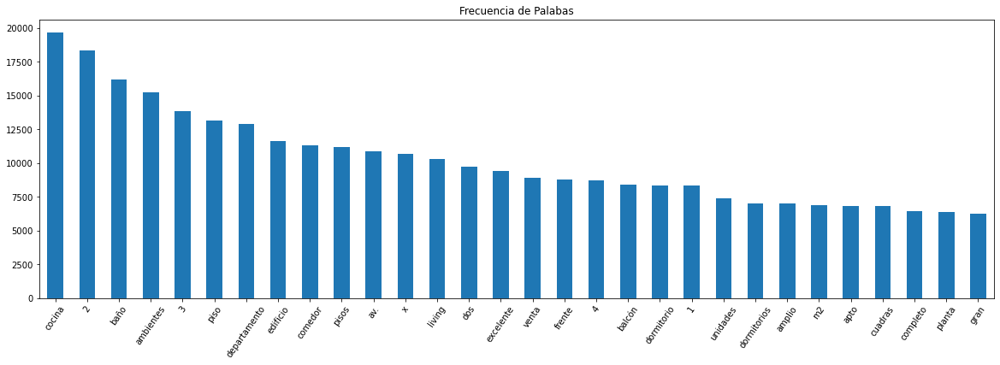

In [71]:
def plotValues(valores, minimo, maximo):
    return valores[minimo:maximo].plot(kind='bar',title ='Frecuencia de Palabas', figsize= (20 , 6), rot = 55);

plotValues(values_descripcion, 0, 30);

- Para Title

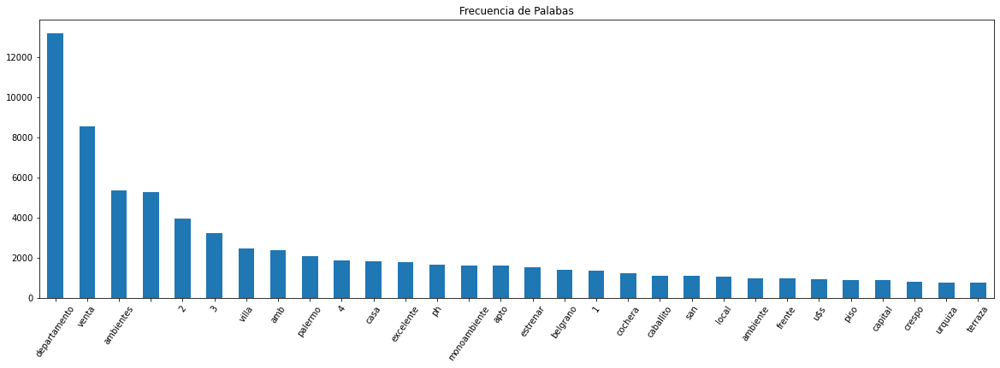

In [72]:
plotValues(values_titulo,  0, 30);

<h2 align="left", style="background: white; color:black">Ambientes en Titulo y Descripcion</h2>

In [76]:
ambientes_descripcion = []
ambientes_titulo = []


diccionario_replace = { 'uno' : 1, 'dos' : 2, 'tres' : 3 , 'cuatro' : 4, 'cinco' : 5 , 'seis' : 6, 'siete' : 7 , 'ocho' : 8 , 'nueve' : 9 , 'dies' : 10 , 'diez': 10,
                       '1' : 1, '2' : 2, '3' : 3 , '4' : 4, '5' : 5 ,'6' : 6, '7' : 7 ,'8' : 8 ,'9' : 9, '10' : 10,'un' : 1, 'mono' : 1}

tuppla_filtros = ( 'ambientes' , 'amb.' , 'amb' )

tuppla_monoambientes = ('monoambiente'  ,'mono-ambiente' ,'ambiente' )



for description in elementos_sin_stowpords_descripcion:
    element = description.split(' ')
    clean_elem = None
    for i in range(len(element)):
        ele = element[i].lower().replace(',','').replace('.','').replace('-','').replace(';','')
        if ele in tuppla_filtros:
            aux = element[i-1].lower()
            clean_elem = diccionario_replace.get(aux)
            if not clean_elem:
                break
        if ele in tuppla_monoambientes:
            clean_elem = 1
            break
    ambientes_descripcion.append(clean_elem)

    
for description in elementos_sin_stowpords_titulo:
    element = description.split(' ')
    clean_elem = None
    for i in range(len(element)):
        ele = element[i].lower().replace(',','').replace('.','').replace('-','').replace(';','')
        if ele in tuppla_filtros:
            aux = element[i-1].lower()
            clean_elem = diccionario_replace.get(aux)
            if not clean_elem:
                break
        if ele in tuppla_monoambientes:
            clean_elem = 1
            break
    ambientes_titulo.append(clean_elem)

In [79]:
display(len(ambientes_descripcion))
pd.Series(ambientes_descripcion).value_counts()

31280

2.0     4482
3.0     3878
1.0     2798
4.0     2266
5.0      422
6.0      114
7.0       54
8.0       13
10.0       6
9.0        6
dtype: int64

In [80]:
display(len(ambientes_titulo))
pd.Series(ambientes_titulo).value_counts()

31280

2.0     3234
3.0     2870
1.0     2061
4.0     1686
5.0      415
6.0      112
7.0       59
8.0       22
9.0        9
10.0       2
dtype: int64

In [81]:
print('La columna Descripcion para ambientes tiene: ',pd.Series(ambientes_descripcion).isnull().sum(),'nulos, mientras que la columna Title para ambientes tiene: ',pd.Series(ambientes_titulo).isnull().sum())

La columna Descripcion para ambientes tiene:  17241 nulos, mientras que la columna Title para ambientes tiene:  20810


<h2 align="left", style="background: white; color:black">Unificacion</h2>

In [93]:
lista_ambientes_final = []
for i in range(len(ambientes_descripcion)):
    if ambientes_descripcion[i] == None:
        lista_ambientes_final.append(ambientes_titulo[i])
    else:
        lista_ambientes_final.append(ambientes_descripcion[i])
        
print('Completamos el % ',(pd.Series(lista_ambientes_final).value_counts().sum()/df_caba.shape[0])*100, 'del data set')

Completamos el %  58.51662404092072 del data set


In [94]:
df_caba['ambientes'] = pd.Series(lista_ambientes_final)

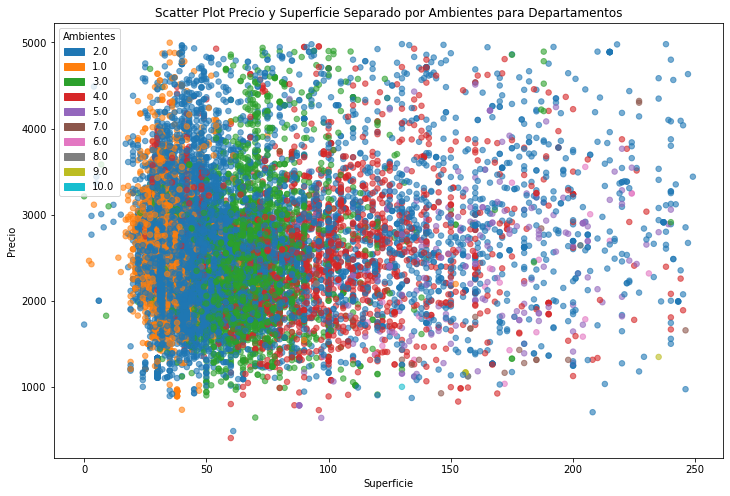

In [119]:
df_caba_apartment = df_caba.loc[df_caba['property_type'] == 'apartment' , :]
df_caba_filter_apartment = df_caba_apartment.loc[(df_caba_apartment['surface_covered_in_m2'] < 250) & (df_caba_apartment['price_usd_per_m2'] < 5000)]

levels, categories = pd.factorize(df_caba_filter_apartment['ambientes'])
colors = [plt.cm.tab10(i) for i in levels] 
handles = [matplotlib.patches.Patch(color=plt.cm.tab10(i), label=c) for i, c in enumerate(categories)]

plt.scatter(df_caba_filter_apartment['surface_covered_in_m2'],df_caba_filter_apartment['price_usd_per_m2'], s=30, alpha=0.6, c =colors)
plt.xlabel('Superficie')
plt.ylabel('Precio')
plt.title('Scatter Plot Precio y Superficie Separado por Ambientes para Departamentos')
plt.legend(handles=handles, title='Ambientes')
plt.rcParams["figure.figsize"] = (12,8)
plt.show()


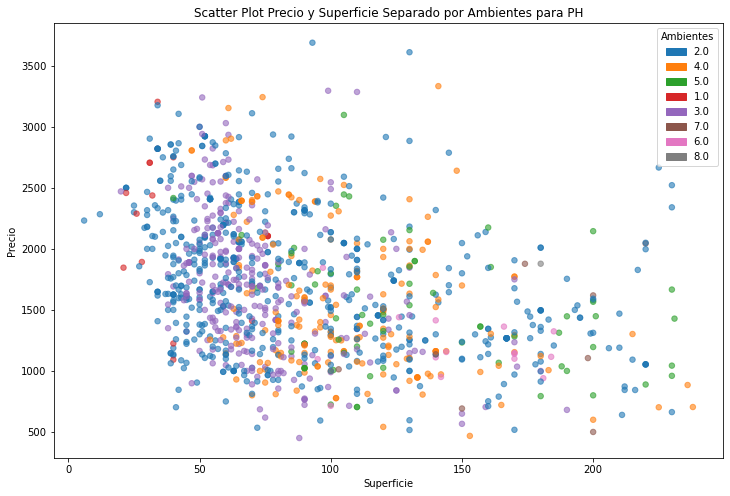

In [120]:
df_caba_apartment = df_caba.loc[df_caba['property_type'] == 'PH' , :]
df_caba_filter_apartment = df_caba_apartment.loc[(df_caba_apartment['surface_covered_in_m2'] < 250) & (df_caba_apartment['price_usd_per_m2'] < 5000)]

levels, categories = pd.factorize(df_caba_filter_apartment['ambientes'])
colors = [plt.cm.tab10(i) for i in levels] 
handles = [matplotlib.patches.Patch(color=plt.cm.tab10(i), label=c) for i, c in enumerate(categories)]

plt.scatter(df_caba_filter_apartment['surface_covered_in_m2'],df_caba_filter_apartment['price_usd_per_m2'], s=30, alpha=0.6, c =colors)
plt.xlabel('Superficie')
plt.ylabel('Precio')
plt.title('Scatter Plot Precio y Superficie Separado por Ambientes para PH')
plt.legend(handles=handles, title='Ambientes')
plt.rcParams["figure.figsize"] = (12,8)
plt.show()

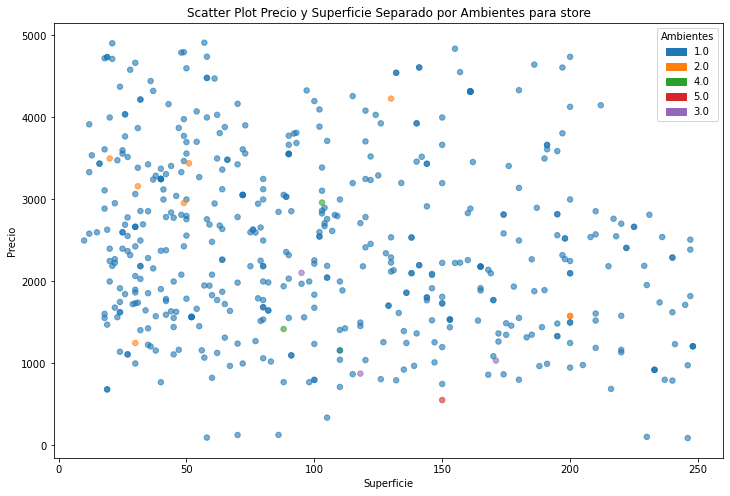

In [121]:
df_caba_apartment = df_caba.loc[df_caba['property_type'] == 'store' , :]
df_caba_filter_apartment = df_caba_apartment.loc[(df_caba_apartment['surface_covered_in_m2'] < 250) & (df_caba_apartment['price_usd_per_m2'] < 5000)]

levels, categories = pd.factorize(df_caba_filter_apartment['ambientes'])
colors = [plt.cm.tab10(i) for i in levels] 
handles = [matplotlib.patches.Patch(color=plt.cm.tab10(i), label=c) for i, c in enumerate(categories)]

plt.scatter(df_caba_filter_apartment['surface_covered_in_m2'],df_caba_filter_apartment['price_usd_per_m2'], s=30, alpha=0.6, c =colors)
plt.xlabel('Superficie')
plt.ylabel('Precio')
plt.title('Scatter Plot Precio y Superficie Separado por Ambientes para store')
plt.legend(handles=handles, title='Ambientes')
plt.rcParams["figure.figsize"] = (12,8)
plt.show()

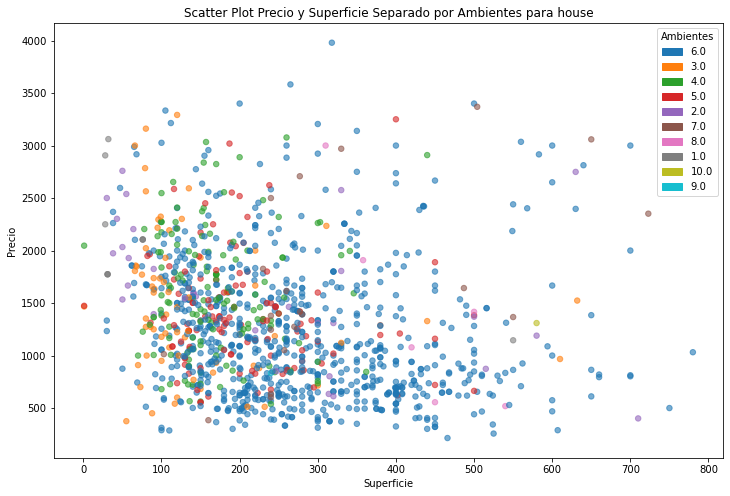

In [126]:
df_caba_apartment = df_caba.loc[df_caba['property_type'] == 'house' , :]
df_caba_filter_apartment = df_caba_apartment.loc[(df_caba_apartment['surface_covered_in_m2'] < 800) & (df_caba_apartment['price_usd_per_m2'] < 4000)]




levels, categories = pd.factorize(df_caba_filter_apartment['ambientes'])
colors = [plt.cm.tab10(i) for i in levels] 
handles = [matplotlib.patches.Patch(color=plt.cm.tab10(i), label=c) for i, c in enumerate(categories)]

plt.scatter(df_caba_filter_apartment['surface_covered_in_m2'],df_caba_filter_apartment['price_usd_per_m2'], s=30, alpha=0.6, c =colors)
plt.xlabel('Superficie')
plt.ylabel('Precio')
plt.title('Scatter Plot Precio y Superficie Separado por Ambientes para house')
plt.legend(handles=handles, title='Ambientes')
plt.rcParams["figure.figsize"] = (12,8)
plt.show()

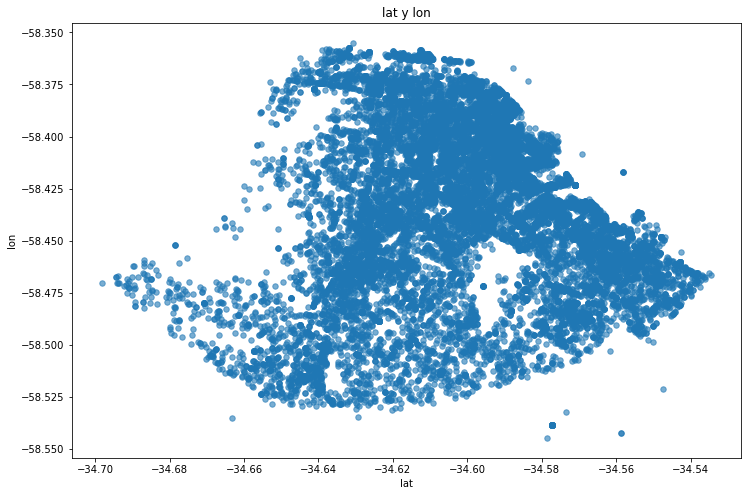

In [171]:
plt.scatter(df_caba.loc[(df_caba['lat'] > -35) & (df_caba['lon'] > -59), ['lat']],df_caba.loc[(df_caba['lat'] > -35) & (df_caba['lon'] > -59), ['lon']], s=30, alpha=0.6)
plt.xlabel('lat')
plt.ylabel('lon')
plt.title('lat y lon')
plt.rcParams["figure.figsize"] = (12,8)
plt.show()

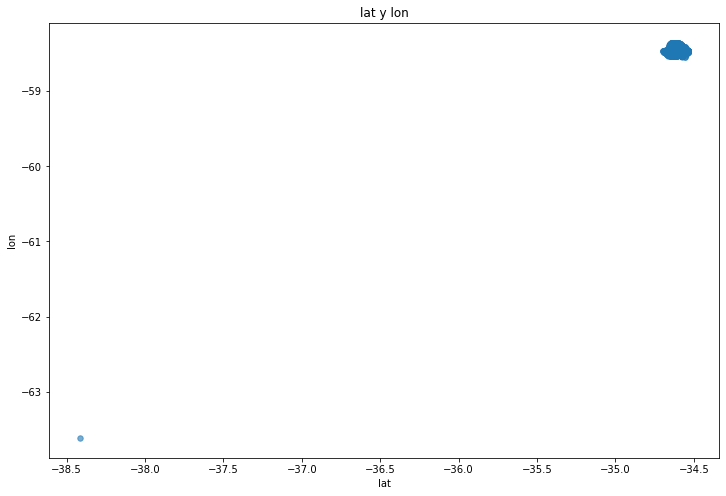

In [172]:
plt.scatter(df_caba['lat'],df_caba['lon'] , s=30, alpha=0.6)
plt.xlabel('lat')
plt.ylabel('lon')
plt.title('lat y lon')
plt.rcParams["figure.figsize"] = (12,8)
plt.show()

In [206]:
median_lon_mataderos = df_caba.loc[df_caba['place_name'] == 'Mataderos', ['lon']].median()


median_lat_mataderos = df_caba.loc[df_caba['place_name'] == 'Mataderos', ['lat']].median()


print('Mediana de la LAT de mataderos: ', median_lat_mataderos)
print('Mediana de la LON de mataderos: ', median_lon_mataderos)

Mediana de la LAT de mataderos:  lat   -34.655797
dtype: float64
Mediana de la LON de mataderos:  lon   -58.502971
dtype: float64


In [ ]:
df_caba['lon'].replace(float(df_caba[df_caba['lon'] < -63]['lon']), float(median_lon_mataderos), inplace=True)

df_caba['lat'].replace(float(df_caba[df_caba['lat'] < -38]['lat']), float(median_lat_mataderos), inplace=True)

## df_caba sin outliers de lat y long

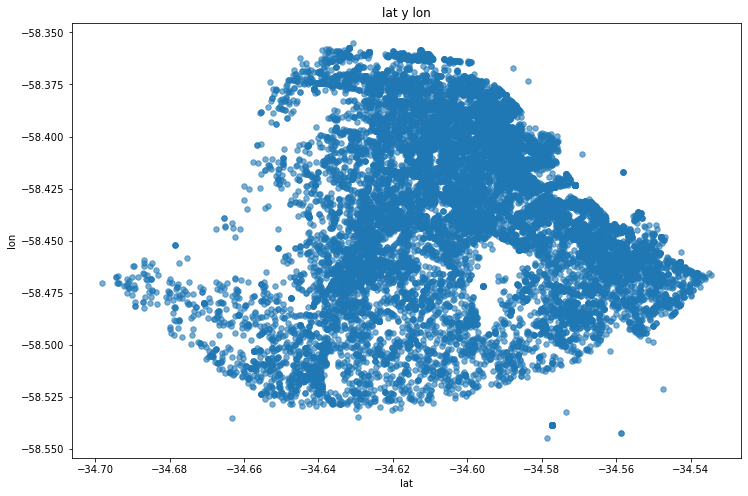

In [212]:
plt.scatter(df_caba['lat'],df_caba['lon'] , s=30, alpha=0.6)
plt.xlabel('lat')
plt.ylabel('lon')
plt.title('lat y lon')
plt.rcParams["figure.figsize"] = (12,8)
plt.show()

<html><h1 align="center", style="background: #414ce8; color:white">Boxplots</h1></html>

[**Volver al Inicio**](#Índice-del-análisis) 

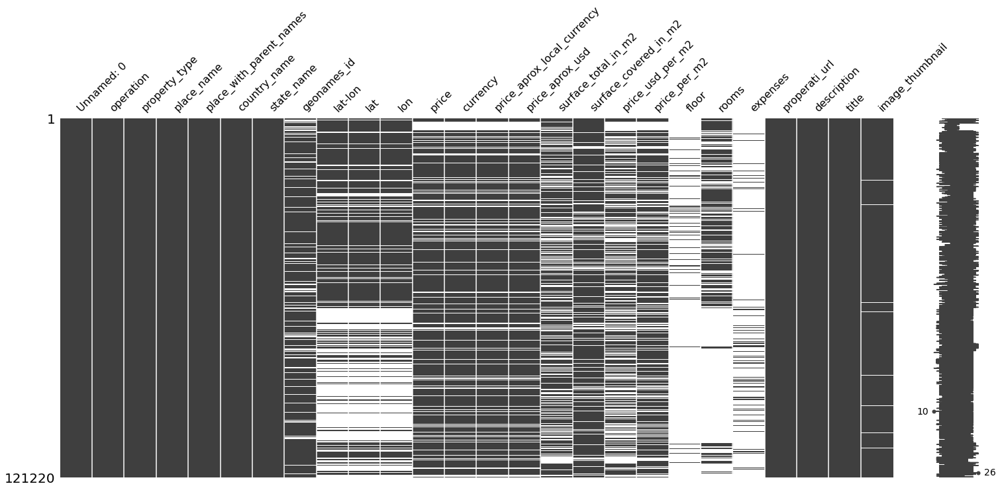

In [132]:

import missingno as msno
msno.matrix(data);


In [55]:
#Definir cotizacion del dolar
(data['price_aprox_local_currency']/data['price_aprox_usd']).mean()

17.644499988455586

In [133]:
data.groupby('state_name')['price'].count()

state_name
Bs.As. G.B.A. Zona Norte        24058
Bs.As. G.B.A. Zona Oeste         7333
Bs.As. G.B.A. Zona Sur          12085
Buenos Aires Costa Atlántica     9059
Buenos Aires Interior            1814
Capital Federal                 29018
Catamarca                          26
Chaco                              36
Chubut                            164
Corrientes                        470
Córdoba                          9038
Entre Ríos                        130
Formosa                            29
Jujuy                              10
La Pampa                           36
La Rioja                            2
Mendoza                           476
Misiones                          348
Neuquén                           324
Río Negro                         361
Salta                             102
San Juan                            4
San Luis                          208
Santa Cruz                         19
Santa Fe                         5413
Santiago Del Estero                 3
T

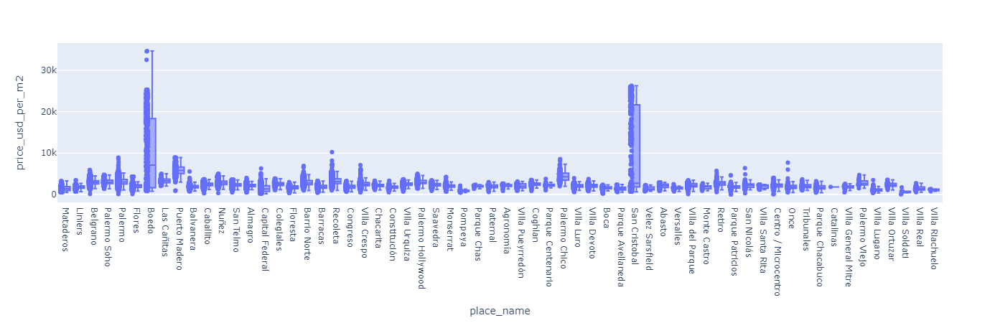

In [57]:
df = px.data.tips()
fig = px.box(df_caba, x="place_name", y="price_usd_per_m2", points="all")#, color ='property_type')
fig.show()
#Sectorizar los barrios por precios y recortar outliers

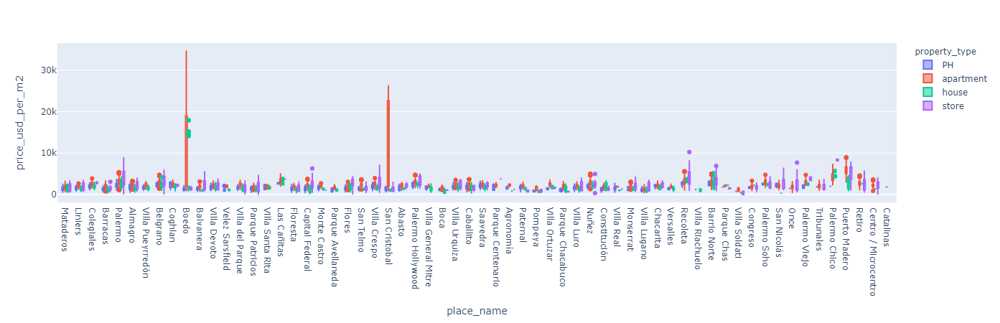

In [58]:
df = px.data.tips()
fig = px.box(df_caba, x="place_name", y="price_usd_per_m2", color ='property_type')
fig.show()

<html><h1 align="center", style="background: #414ce8; color:white">Geopandas</h1></html>

[**Volver al Inicio**](#Índice-del-análisis) 

In [ ]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import shapely.wkt


In [ ]:
df_caba = df_caba[df_caba['lon'] < -35.0]
df_caba.head()

In [ ]:
geo_caba = gpd.GeoDataFrame(df_caba, geometry = gpd.points_from_xy(df_caba.lon, df_caba.lat))
barrios = pd.read_csv("/content/drive/MyDrive/TP Data Science/barrios.csv", encoding='latin1')
barrios["WKT"] = barrios["WKT"].apply(shapely.wkt.loads) 
geo_barrios = gpd.GeoDataFrame(barrios, geometry='WKT')

In [ ]:
fig, ax = plt.subplots(figsize=(15, 10))
ax.set_aspect('equal')
geo_barrios.plot(ax=ax, color='white', edgecolor='black')
geo_caba['geometry'].plot(ax=ax, marker='o', color='red', markersize=40)
plt.show();
#Buscar el outlier
